In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset
import numpy as np
import cv2

In [2]:
import matplotlib.pyplot as plt

In [3]:
import skimage.io

In [4]:
import albumentations as albu
import torch

In [5]:
import numpy as np
import segmentation_models_pytorch as smp

C:\Users\bjk_a\anaconda3\envs\graduation\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        #31
        plt.imshow(image, cmap = 'Greys')
    plt.show()
    
palette ={ 
            0: (0,0,0), #no data 
            1: (250, 1,  1), #built up
            2: (240, 150, 255), #crop lands
            3: (255, 255, 76),  #grassland
            4: (255, 187, 34),  #SHRUBLAND
            5: (1, 100, 1),  #TREE COVER
            6: (1, 207, 117), # Permanent crops ### 221 (NOT ESA)
            7: (180, 180, 180),  #Bare-Sparse-Veg
            8: (1, 100, 200)  #waterbodies
    
         }

invert_palette = {v: k for k, v in palette.items()}

def convert_to_color(arr_2d, palette=palette):
    """ Numeric labels to RGB-color encoding """
    arr_3d = np.zeros((arr_2d.shape[0], arr_2d.shape[1], 3), dtype=np.uint8)

    for c, i in palette.items():
        m = arr_2d == c
        arr_3d[m] = i

    return arr_3d

def convert_from_color(arr_3d, palette=invert_palette):
    """ RGB-color encoding to grayscale labels """
    arr_2d = np.zeros((arr_3d.shape[0], arr_3d.shape[1]), dtype=np.uint8)

    for c, i in palette.items():
        m = np.all(arr_3d[:,:,:3] == np.array(c).reshape(1, 1, 3), axis=2)
        arr_2d[m] = i

    return arr_2d


In [7]:
DATA_DIR = r"D:\Dataset"


x_train_dir = os.path.join(DATA_DIR, 'Train', 'Image')
y_train_dir = os.path.join(DATA_DIR, 'Train', 'Mask')

x_valid_dir = os.path.join(DATA_DIR, 'Valid', 'Image')
y_valid_dir = os.path.join(DATA_DIR, 'Valid', 'Mask')

x_test_dir = os.path.join(DATA_DIR, 'Test', 'Image')
y_test_dir = os.path.join(DATA_DIR, 'Test', 'Mask')

In [8]:
class Dataset(BaseDataset):
    
    def __init__(
            self, 
            images_dir, 
            masks_dir, 
            augmentation=None, 
            preprocessing=None,
    ):
        self.ids = os.listdir(images_dir)
        self.mask_ids = os.listdir(masks_dir)
        
        self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]
        self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in self.mask_ids]
        
        self.class_values = np.arange(0,9,1)
        
        self.augmentation = augmentation
        self.preprocessing = preprocessing
        
    @staticmethod
    def _read_img(image_path):
        img = skimage.io.imread(image_path, plugin='tifffile')
        return img

    def __getitem__(self, i):
        
        # read data
        im_id = self.images_fps[i].split('\\')[-1]
        image = self._read_img(self.images_fps[i])
        image = np.expand_dims(image, axis = -1)
        mask =  self._read_img(self.masks_fps[i])
        
        if self.augmentation is not None:
            transformed = self.augmentation(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"]
            
        if self.preprocessing:
            preprocessed  = self.preprocessing(image=image, mask=mask)
            image,mask = preprocessed['image'], preprocessed['mask']

        mask_raw = convert_from_color(mask)        
        masks = [(mask_raw == v) for v in self.class_values]        
        mask = np.stack(masks, axis=-1)              
       
        image = image.transpose(2, 0, 1).astype('float32') #
        mask = mask.transpose(2, 0, 1).astype('float32')
        
        image = torch.as_tensor(image, dtype=torch.float32).cuda()
        mask = torch.as_tensor(mask, dtype=torch.float32).cuda()   

        return image, mask
        
    def __len__(self):
        return len(self.ids)

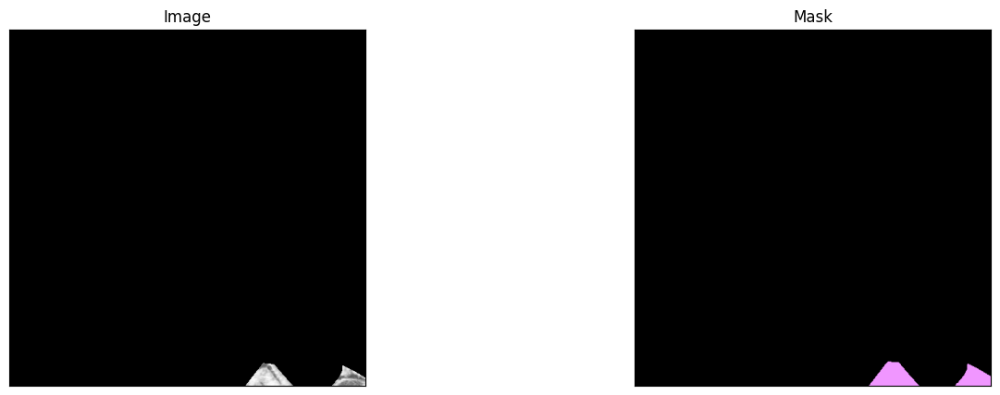

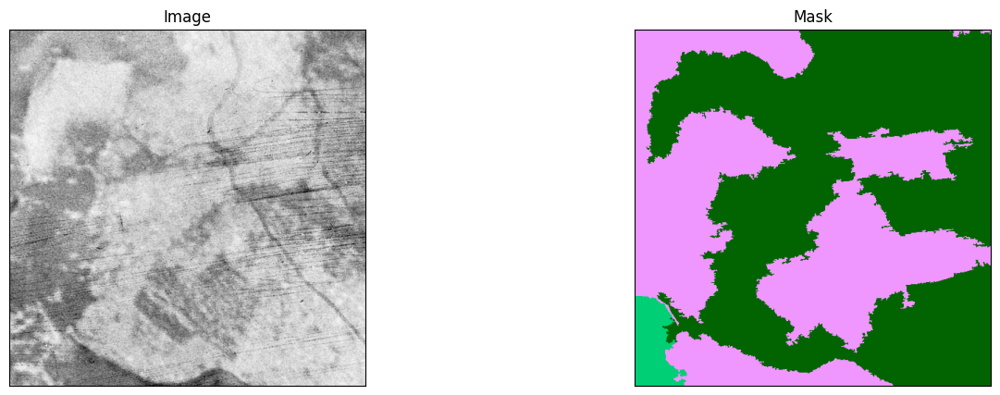

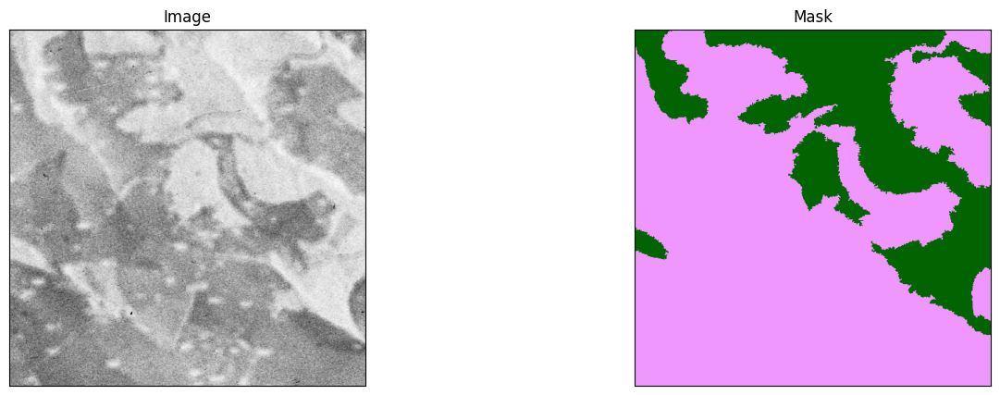

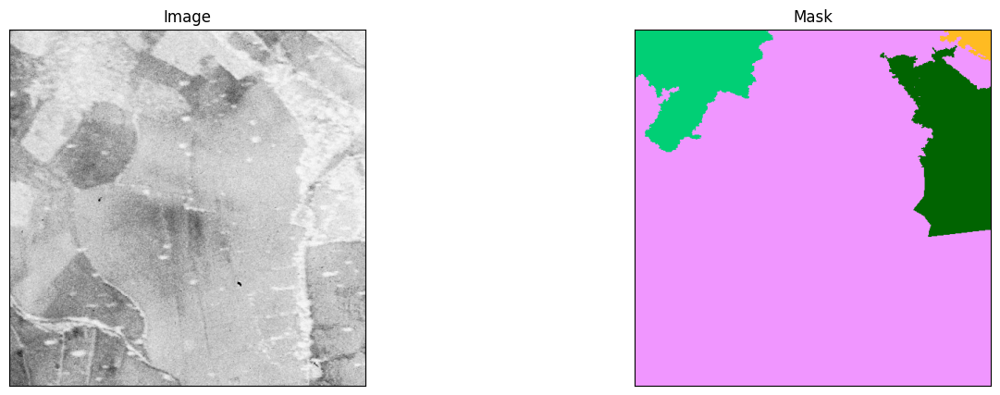

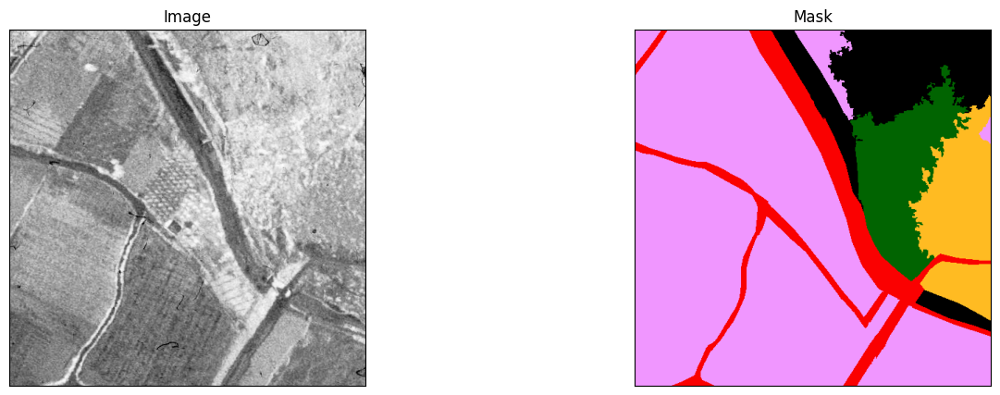

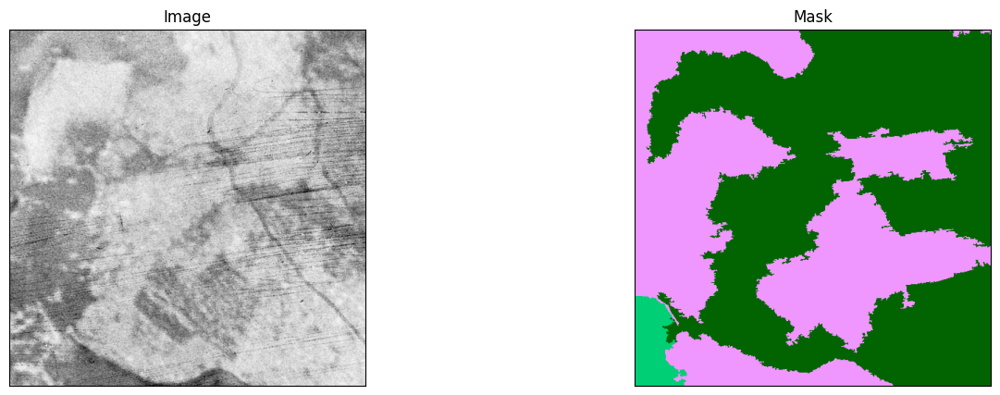

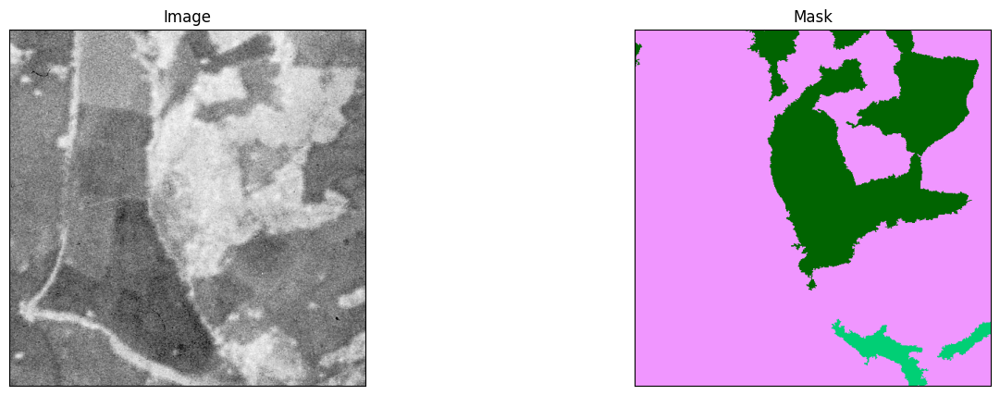

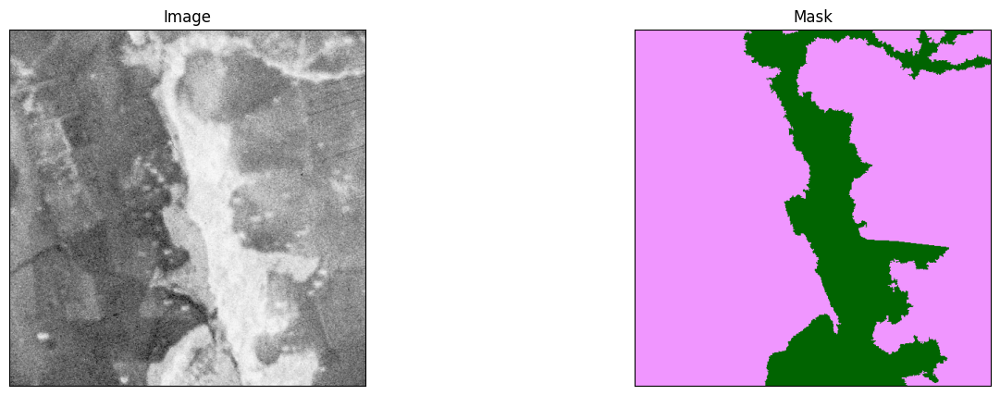

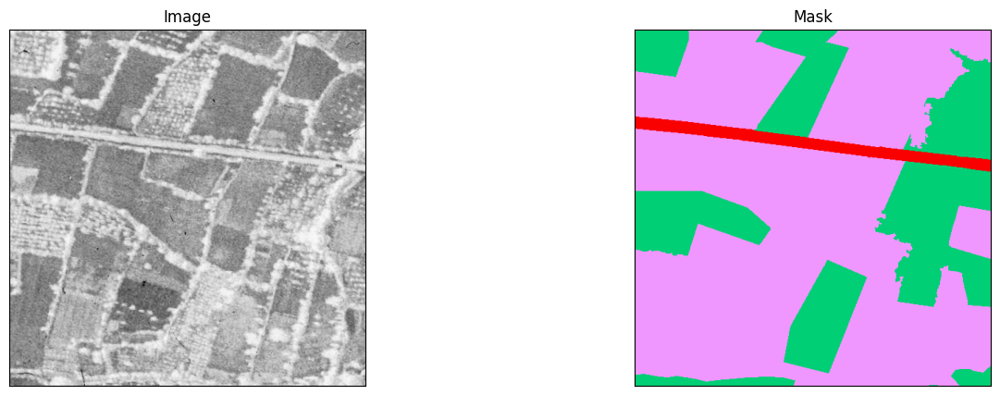

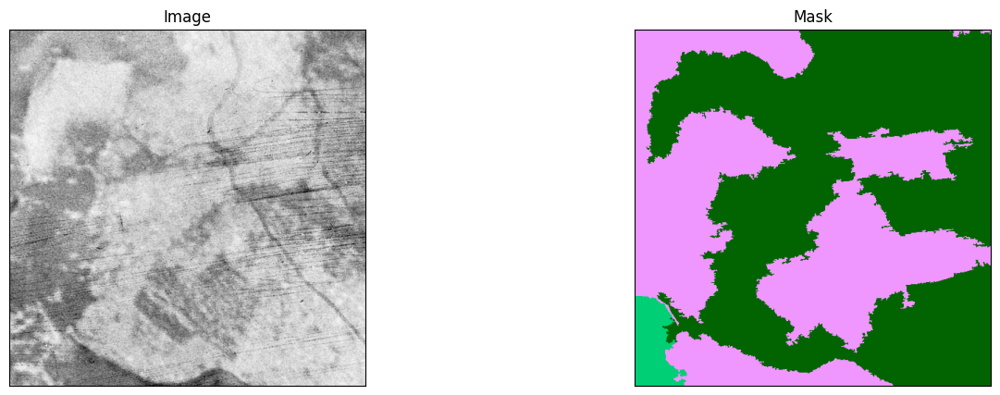

In [9]:
for i in range(10):
    dataset = Dataset(x_train_dir, y_train_dir)

    image, mask = dataset[np.random.randint(len(dataset))] # get some sample

    image = image.detach().cpu().numpy()
    mask  = mask.detach().cpu().numpy()

    image = np.transpose(image, (1,2,0))
    mask = np.transpose(mask, (1,2,0))
    mask = np.argmax(mask, axis = 2)
    mask = convert_to_color(mask)
    
    visualize(
        image=image, 
        mask =mask)

In [10]:
def get_training_augmentation():
    train_transform = [

        albu.HorizontalFlip(p=0.5),
        #albu.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1, border_mode=0),
        albu.RandomCrop(height=256, width=256, always_apply=True),


    ]
    return albu.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        albu.HorizontalFlip(p=0.5),
        #albu.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1, border_mode=0),
        albu.RandomCrop(height=256, width=256, always_apply=True),
    ]
    return albu.Compose(test_transform)

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform
    
    Args:
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    
    """
    
    _transform = [
        albu.Lambda(image=preprocessing_fn),
    ]
    return albu.Compose(_transform)

In [11]:
import ssl
import urllib.request

# SSL sertifikasının doğrulanmasını devre dışı bırak
ssl._create_default_https_context = ssl._create_unverified_context
# urllib.request modülündeki urlopen fonksiyonunun context parametresini ayarla
urllib.request.urlopen = urllib.request.urlopen


ENCODER = 'mobilenet_v2'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = len(palette)
ACTIVATION = 'softmax' 
DEVICE = 'cuda'

model = smp.DeepLabV3Plus(
                encoder_name=ENCODER, 
                encoder_weights= 'imagenet', 
                classes=CLASSES, 
                activation=ACTIVATION,
                in_channels = 1)

log_path = r"D:\sonuc2"
experiment_log = r"deeplabv3+_mobilenet_v2"

In [12]:
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    augmentation= get_training_augmentation(), 
    preprocessing= None, 
)

valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    augmentation= get_validation_augmentation(), 
    preprocessing= None,
)

In [13]:
from sklearn.utils import compute_sample_weight
from pytorch_toolbelt.utils import fs
from torch.utils.data import WeightedRandomSampler

def get_balanced_weights(dataset):
    labels=[]
    for mask in dataset.masks_fps:
      mask = fs.read_image_as_is(mask)
      unique_labels = np.unique(mask)
      labels.append(''.join([str(int(i)) for i in unique_labels]))

    weights = compute_sample_weight('balanced', labels)
    return weights

In [14]:
mul_factor =  5
train_sampler = WeightedRandomSampler(get_balanced_weights(train_dataset), len(train_dataset) * mul_factor)
val_sampler = WeightedRandomSampler(get_balanced_weights(valid_dataset), len(valid_dataset) * mul_factor)

In [15]:
import gc
torch.cuda.empty_cache()
gc.collect()

24539

In [16]:
train_loader = DataLoader(train_dataset, batch_size=8, sampler = train_sampler, drop_last= True)
valid_loader = DataLoader(valid_dataset, batch_size=8, sampler = val_sampler, drop_last = True)

In [17]:
import segmentation_models_pytorch.utils as smp

loss = smp.losses.DiceLoss()

metrics = [smp.metrics.Accuracy(threshold=0.5),
    smp.metrics.IoU(threshold=0.5),
    smp.metrics.Fscore(threshold=0.5),
    smp.metrics.Precision(threshold=0.5),
    smp.metrics.Recall(threshold=0.5)
]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0002),
])


In [18]:
# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [19]:
max_score = 0

for i in range(0, 50):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model, os.path.join(log_path, '.\{}.pth'.format(experiment_log)))
        
        
        
        
        print('Model saved!')
        
    if i == 10:
        optimizer.param_groups[0]['lr'] = 1e-4
        print('Decrease decoder learning rate to 1e-5!')
    elif i==25:
        optimizer.param_groups[0]['lr'] = 1e-5
        print('Decrease decoder learning rate to 1e-5!/2')


Epoch: 0
train:   0%|          | 0/101 [00:00<?, ?it/s]

C:\Users\bjk_a\anaconda3\envs\graduation\lib\site-packages\segmentation_models_pytorch\base\modules.py:116: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self.activation(x)


valid: 100%|██████████| 20/20 [00:03<00:00,  5.42it/s, dice_loss - 0.3764, accuracy - 0.9216, iou_score - 0.478, fscore - 0.641, precision - 0.6516, recall - 0.6308]  
Model saved!

Epoch: 1
valid: 100%|██████████| 20/20 [00:03<00:00,  6.11it/s, dice_loss - 0.3003, accuracy - 0.9352, iou_score - 0.5562, fscore - 0.7066, precision - 0.7105, recall - 0.7028]
Model saved!

Epoch: 2
valid: 100%|██████████| 20/20 [00:03<00:00,  5.77it/s, dice_loss - 0.3434, accuracy - 0.9247, iou_score - 0.5022, fscore - 0.6595, precision - 0.6622, recall - 0.657] 

Epoch: 3
valid: 100%|██████████| 20/20 [00:03<00:00,  5.96it/s, dice_loss - 0.2671, accuracy - 0.9422, iou_score - 0.59, fscore - 0.7383, precision - 0.7427, recall - 0.734]   
Model saved!

Epoch: 4
valid: 100%|██████████| 20/20 [00:03<00:00,  6.17it/s, dice_loss - 0.3115, accuracy - 0.9316, iou_score - 0.5356, fscore - 0.6913, precision - 0.6933, recall - 0.6893]

Epoch: 5
valid: 100%|██████████| 20/20 [00:03<00:00,  6.03it/s, dice_loss - 0.28

valid: 100%|██████████| 20/20 [00:08<00:00,  2.42it/s, dice_loss - 0.3324, accuracy - 0.927, iou_score - 0.5095, fscore - 0.67, precision - 0.6723, recall - 0.6677]   

Epoch: 24
valid: 100%|██████████| 20/20 [00:08<00:00,  2.37it/s, dice_loss - 0.2805, accuracy - 0.9381, iou_score - 0.5709, fscore - 0.7209, precision - 0.7216, recall - 0.7201]

Epoch: 25
valid: 100%|██████████| 20/20 [00:03<00:00,  6.18it/s, dice_loss - 0.2821, accuracy - 0.9377, iou_score - 0.5675, fscore - 0.7195, precision - 0.7203, recall - 0.7186]
Decrease decoder learning rate to 1e-5!/2

Epoch: 26
valid: 100%|██████████| 20/20 [00:03<00:00,  6.03it/s, dice_loss - 0.2526, accuracy - 0.9441, iou_score - 0.6059, fscore - 0.7482, precision - 0.7489, recall - 0.7475]

Epoch: 27
valid: 100%|██████████| 20/20 [00:03<00:00,  5.85it/s, dice_loss - 0.2725, accuracy - 0.9399, iou_score - 0.5871, fscore - 0.7293, precision - 0.7302, recall - 0.7284]

Epoch: 28
valid: 100%|██████████| 20/20 [00:03<00:00,  5.90it/s, dice_los

valid: 100%|██████████| 20/20 [00:03<00:00,  6.10it/s, dice_loss - 0.2583, accuracy - 0.943, iou_score - 0.6024, fscore - 0.7432, precision - 0.7439, recall - 0.7426] 

Epoch: 47
valid: 100%|██████████| 20/20 [00:03<00:00,  6.01it/s, dice_loss - 0.2859, accuracy - 0.9369, iou_score - 0.567, fscore - 0.7157, precision - 0.7168, recall - 0.7147] 

Epoch: 48
valid: 100%|██████████| 20/20 [00:03<00:00,  5.91it/s, dice_loss - 0.2748, accuracy - 0.9394, iou_score - 0.5772, fscore - 0.7268, precision - 0.7277, recall - 0.726] 

Epoch: 49
valid: 100%|██████████| 20/20 [00:03<00:00,  6.03it/s, dice_loss - 0.2615, accuracy - 0.9424, iou_score - 0.5957, fscore - 0.7407, precision - 0.7413, recall - 0.7401]


In [20]:
best_model = torch.load(os.path.join(log_path, '.\{}.pth'.format(experiment_log)))

In [21]:
best_model.modules

<bound method Module.modules of DeepLabV3Plus(
  (encoder): MobileNetV2Encoder(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
     

In [22]:
best_model.cuda()

DeepLabV3Plus(
  (encoder): MobileNetV2Encoder(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, kerne

In [23]:
# create test dataset
test_dataset = Dataset(
    x_test_dir,
    y_test_dir,
)

test_dataloader = DataLoader(test_dataset)

In [24]:
# evaluate model on test set
test_epoch = smp.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
)

logs = test_epoch.run(test_dataloader)

valid: 100%|██████████| 35/35 [00:03<00:00, 10.07it/s, dice_loss - 0.2642, accuracy - 0.9418, iou_score - 0.6143, fscore - 0.7377, precision - 0.7384, recall - 0.737] 


In [25]:
logs

{'dice_loss': 0.264223074913025,
 'accuracy': 0.941812516961779,
 'iou_score': 0.6143421664834023,
 'fscore': 0.737709408572742,
 'precision': 0.738384532076972,
 'recall': 0.7370387486049108}

In [26]:
# test dataset without transformations for image visualization
test_dataset_vis = Dataset(
    x_test_dir, y_test_dir)

C:\Users\bjk_a\AppData\Local\Temp\ipykernel_20124\3018184793.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor = torch.unsqueeze(torch.tensor(x_tensor), axis = 0)
C:\Users\bjk_a\AppData\Local\Temp\ipykernel_20124\3018184793.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor = torch.tensor(tensor, device = 'cuda')


[  1 100 150 240 255]


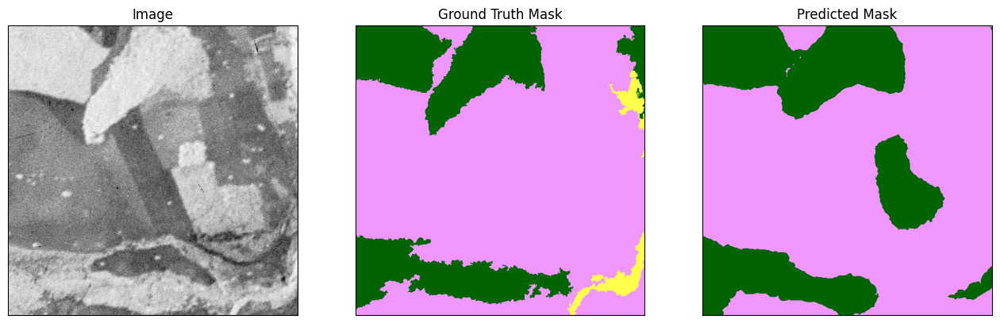

[  1 100 117 150 207 240 255]


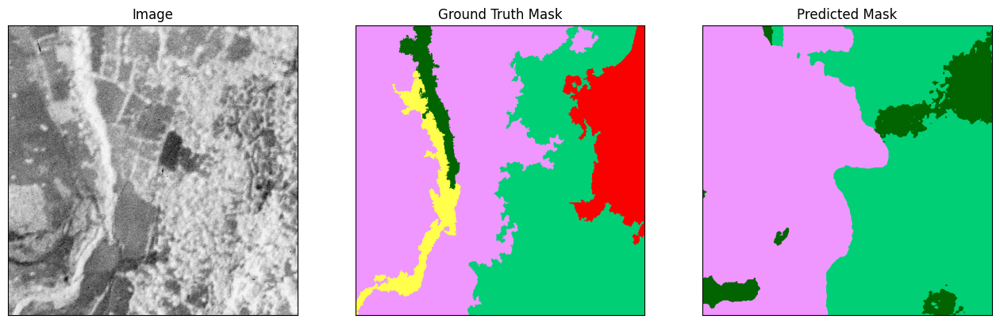

[  1  34 100 117 150 187 207 240 255]


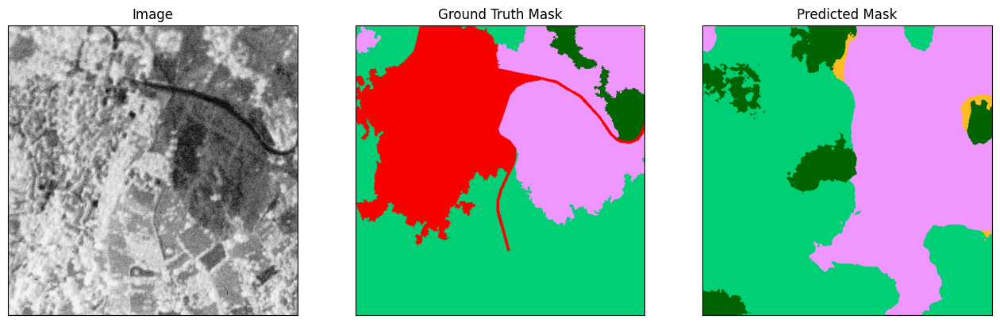

[  1 100 117 150 207 240 255]


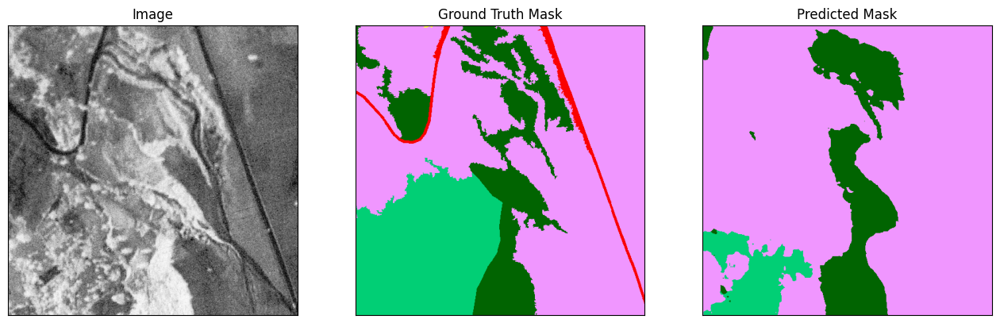

[  1 100 117 150 207 240 255]


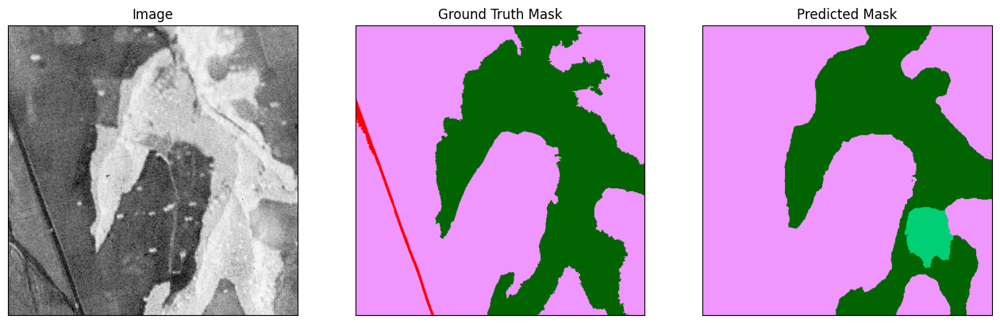

[  1 100 117 150 207 240 255]


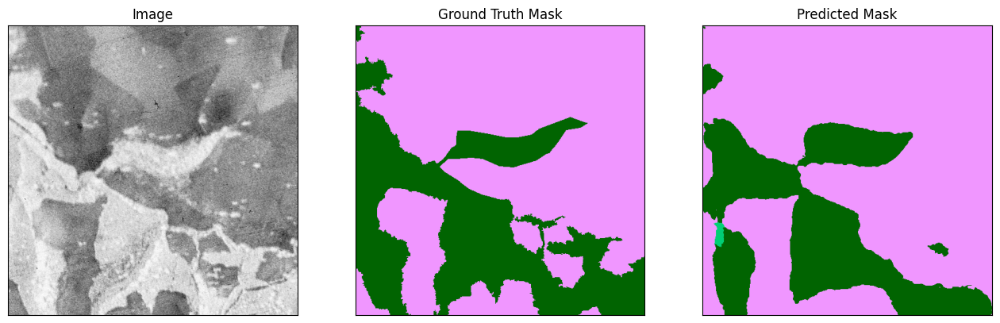

[  1 100 150 240 255]


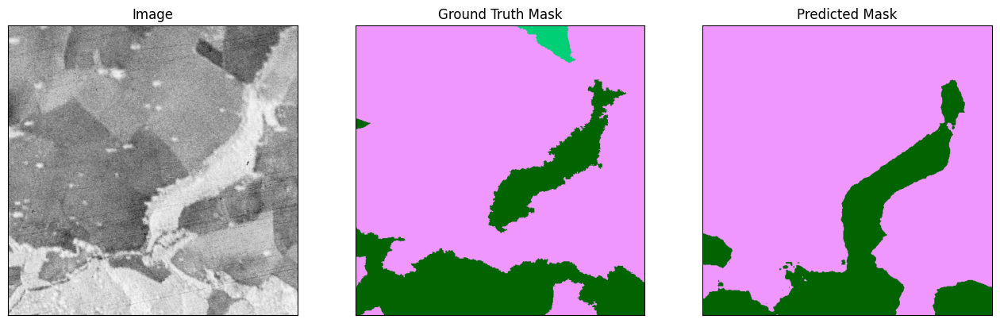

[  1 100 117 150 207 240 255]


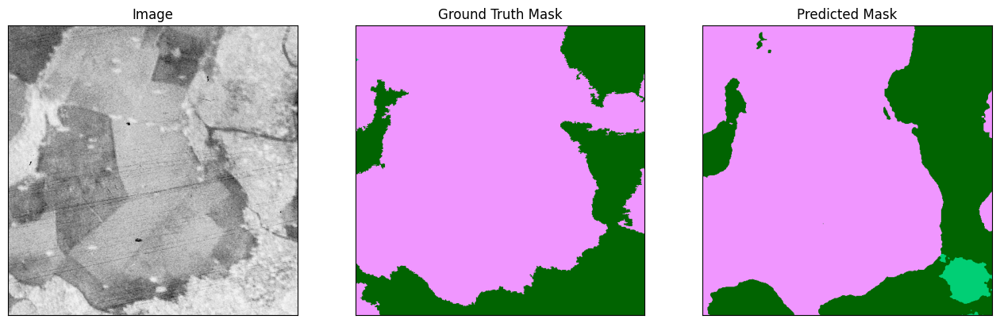

[  1 100 117 150 207 240 255]


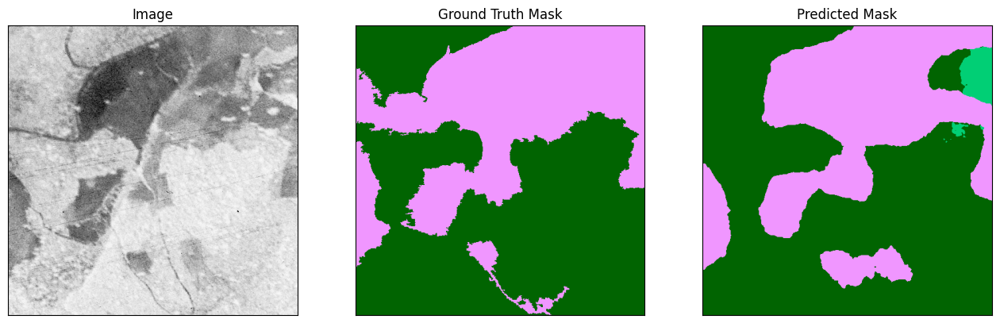

[  1 100 117 150 207 240 255]


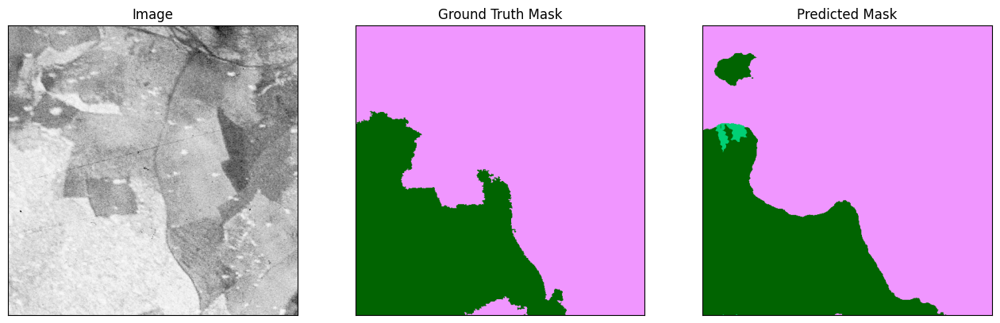

[  0   1 100 150 240 255]


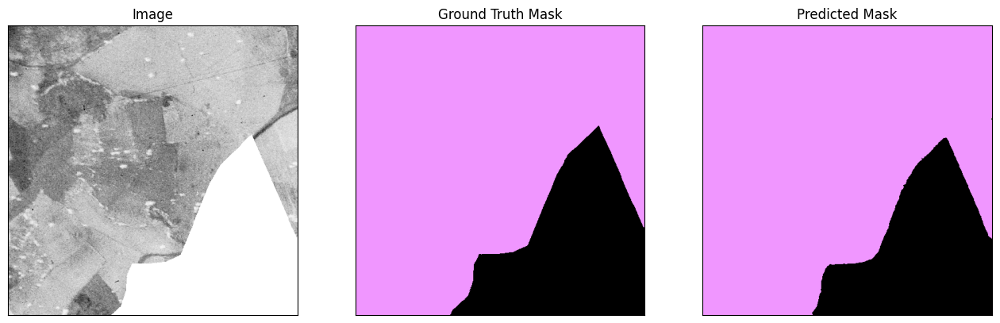

[  0   1 100 117 150 207 240 255]


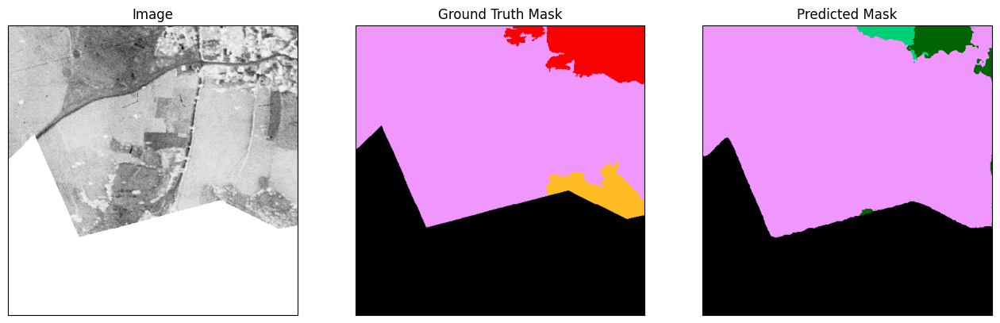

[  1 100 150 240 255]


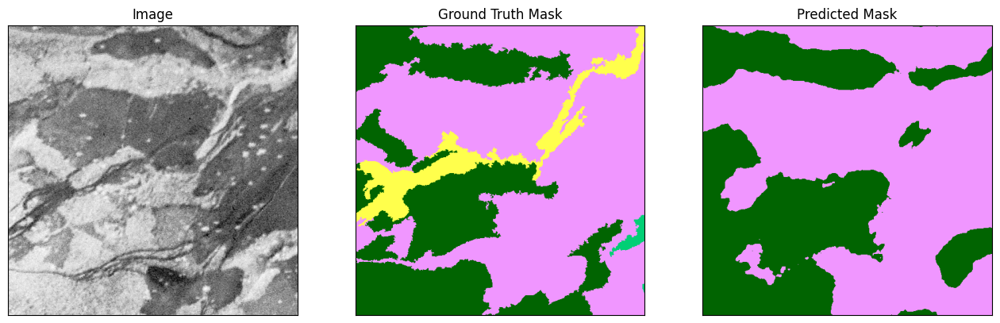

[  1  34 100 117 150 187 207 240 255]


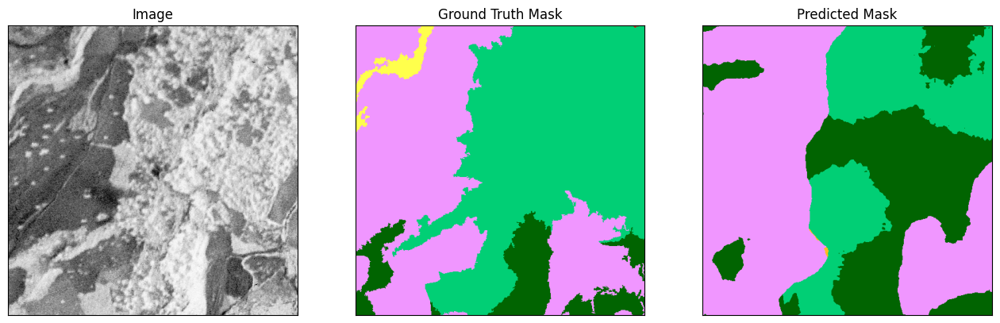

[  0   1  34 100 117 150 187 207 240 255]


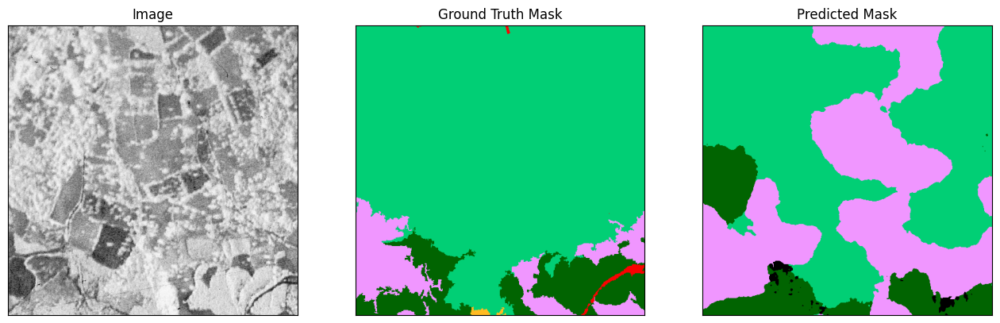

[  0   1  34 100 117 150 187 207 240 255]


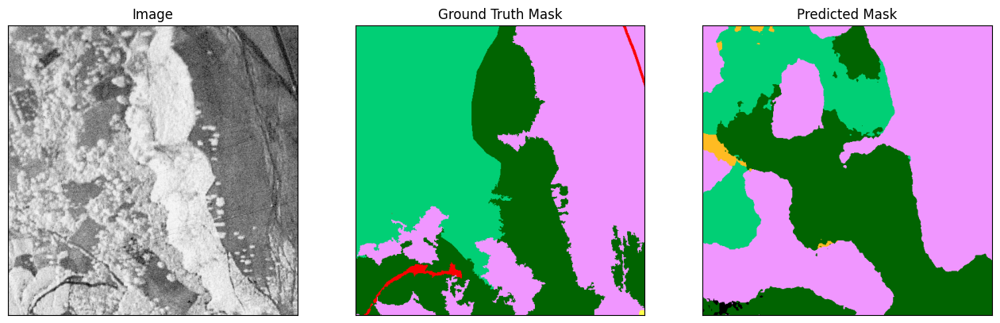

[  1 100 150 240 255]


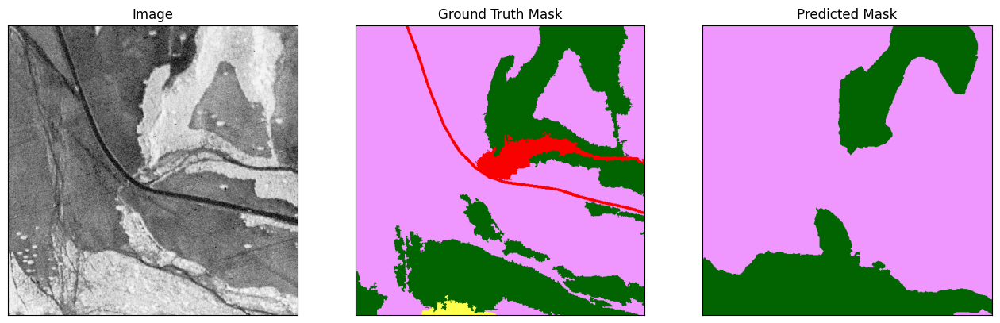

[  1  34 100 117 150 187 207 240 255]


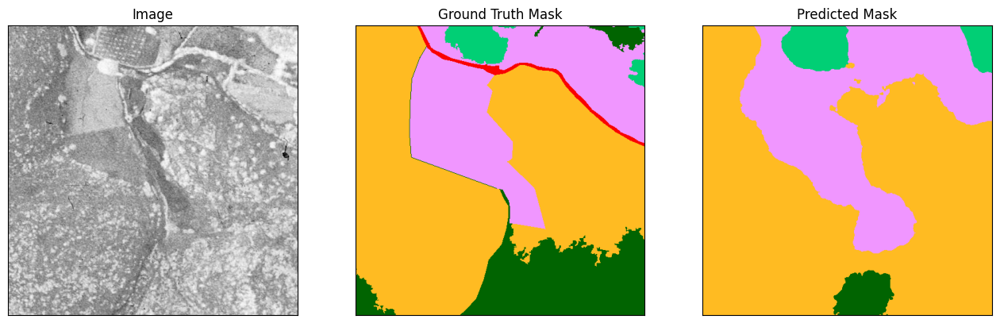

[  1  34 100 117 150 187 207 240 255]


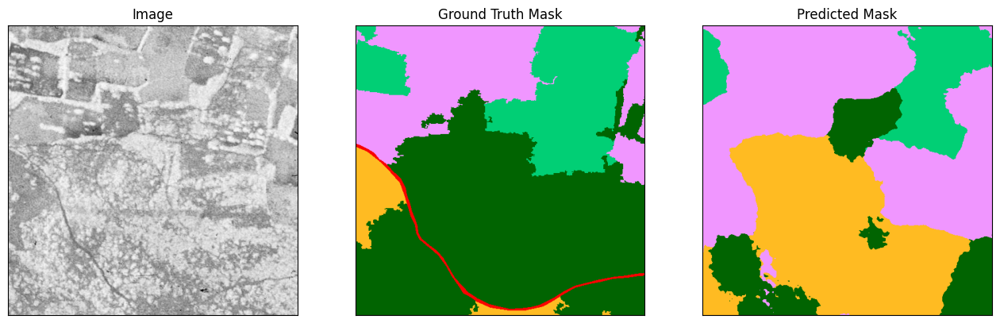

[  0   1  34 100 117 150 187 207 240 255]


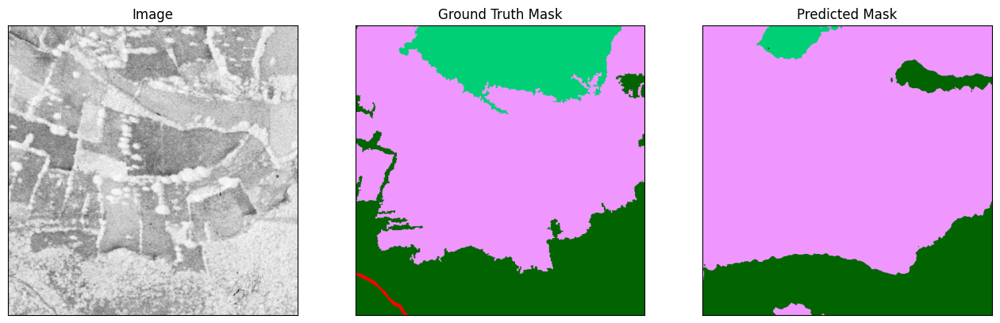

[  0   1  34 100 150 187 240 255]


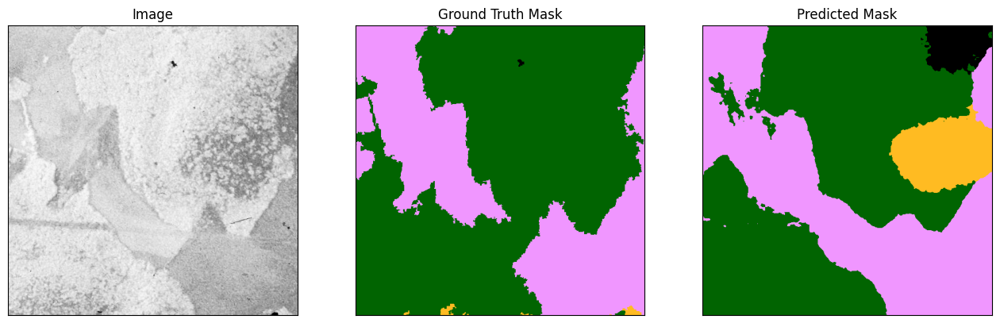

[  0   1 100 150 240 255]


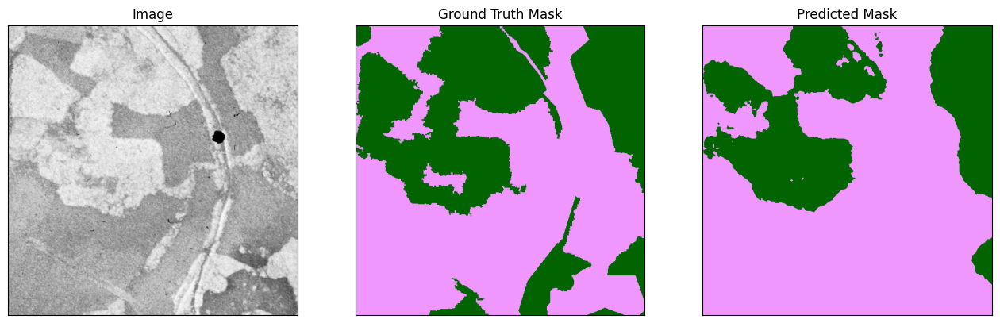

[  0   1 100 150 240 255]


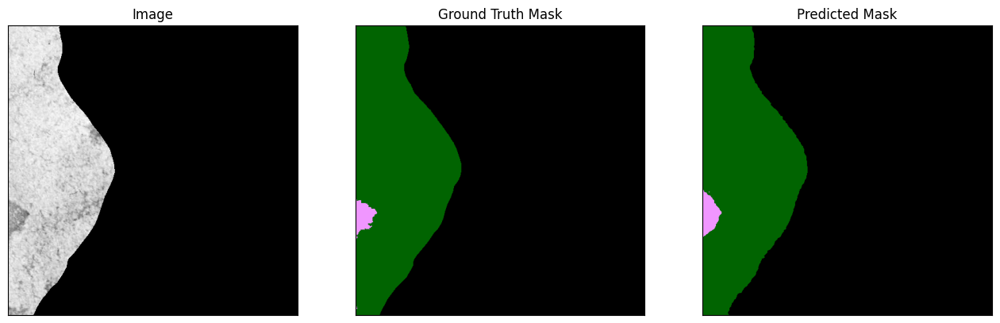

[  0   1  34 100 150 187 240 255]


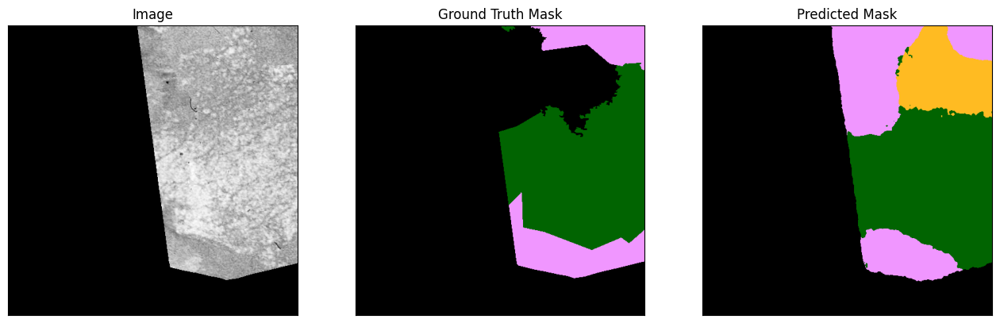

[  0   1  34 100 150 187 240 255]


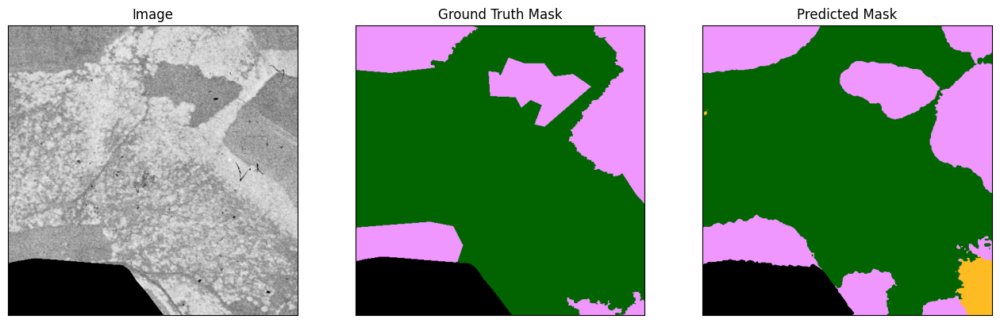

[  0   1  34 100 150 187 240 255]


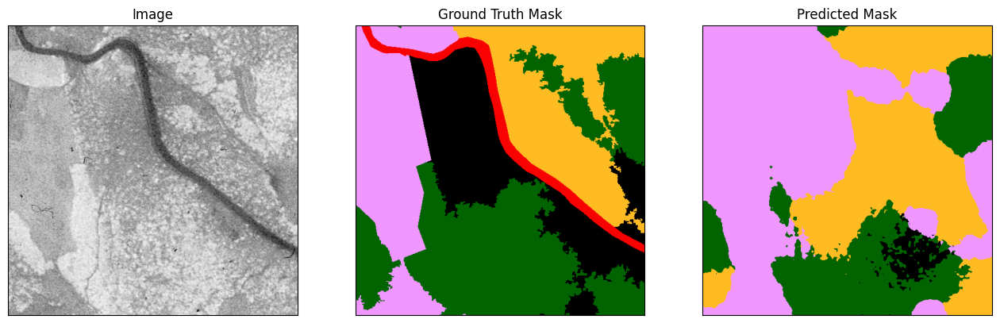

[  1  34 100 150 187 240 255]


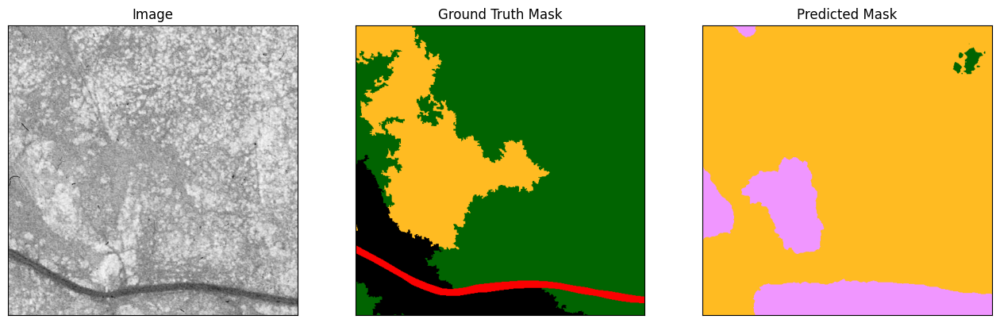

[  0   1  34 100 150 187 240 255]


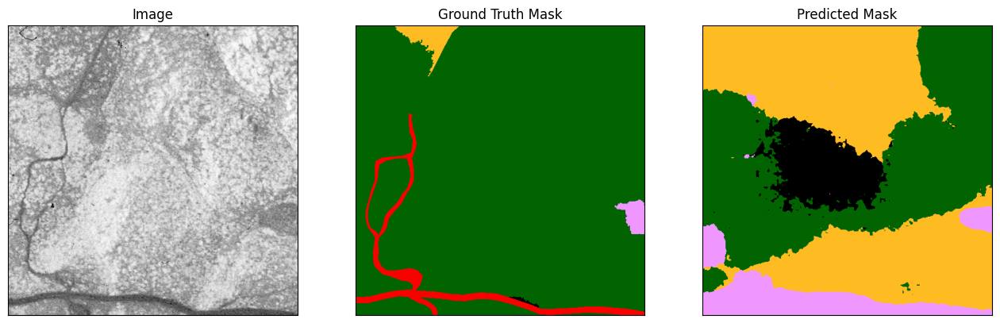

[  1  34 100 150 187 240 255]


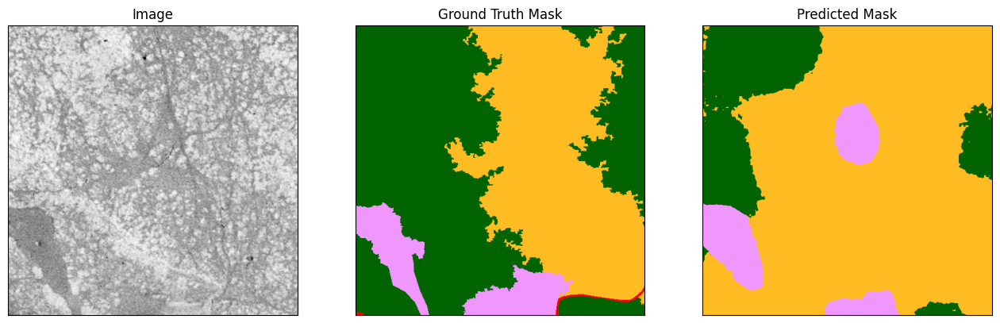

[  1  34 100 187 255]


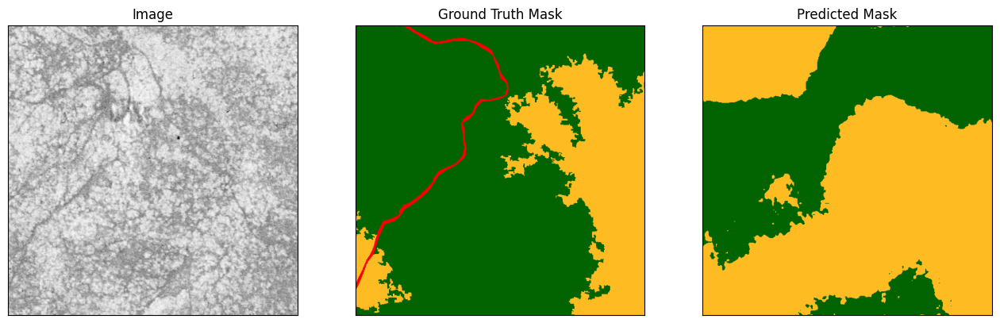

[  0   1  34 100 150 187 240 255]


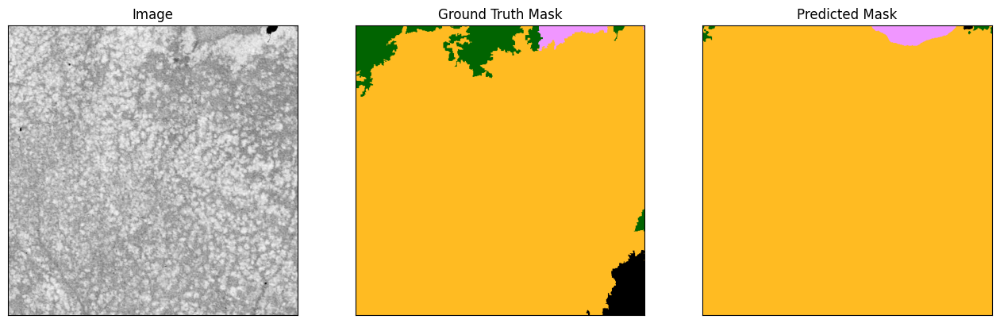

[  0   1  34 100 150 187 240 255]


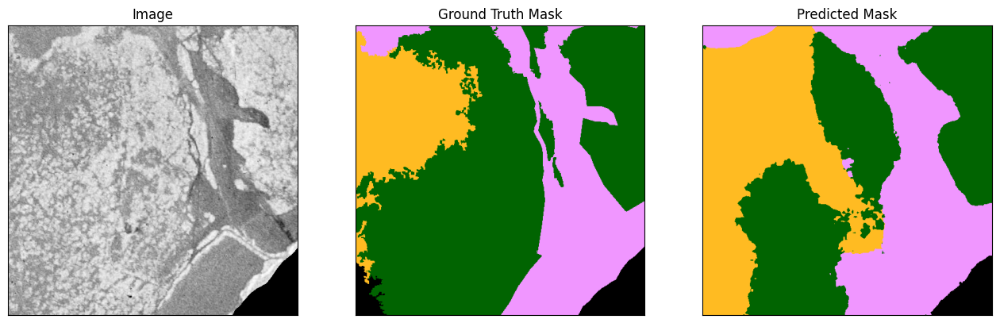

[  0   1 117 150 207 240 255]


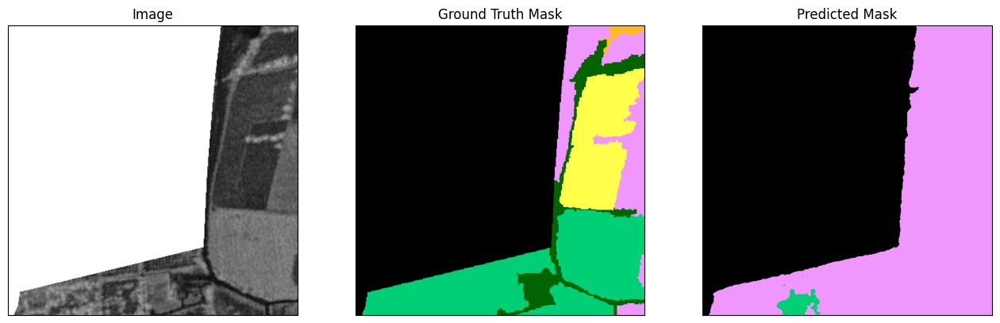

[  0 150 240 255]


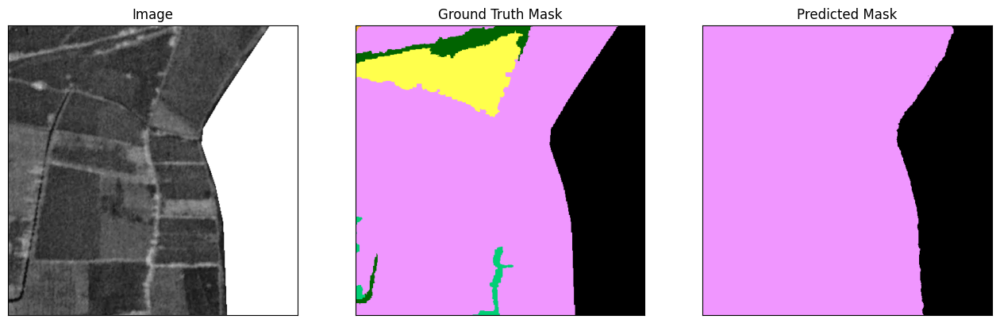

[  0   1 117 150 207 240 255]


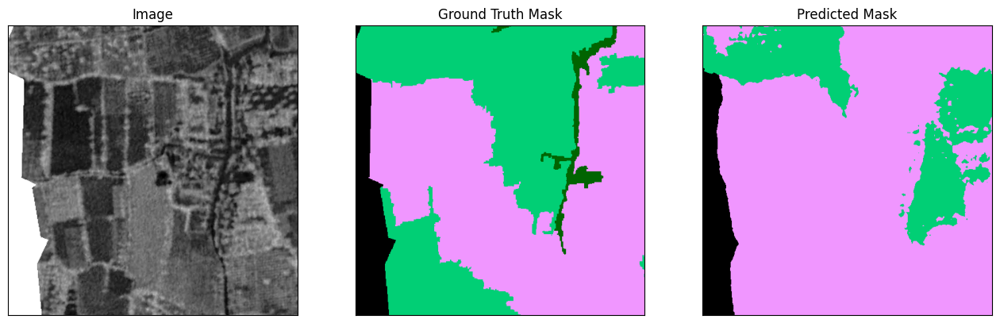

In [27]:
for i in range(len(test_dataset)):
        
    image = np.transpose(test_dataset[i][0].detach().cpu().numpy(),(1,2,0))

    gt_mask = np.transpose(test_dataset[i][1].detach().cpu().numpy()  ,(1,2,0))
    
    gt_max = np.argmax(gt_mask, axis=-1)
    gt_color = convert_to_color(gt_max)    

    x_tensor = test_dataset[i][0]
    tensor = torch.unsqueeze(torch.tensor(x_tensor), axis = 0)
    tensor = tensor.float() 
    tensor = torch.tensor(tensor, device = 'cuda')

    pr_mask = best_model.predict(tensor).detach().cpu().numpy()
    pr_max  = np.argmax(pr_mask, 1)
    pr_max = np.transpose(pr_max, (1,2,0)).squeeze()
    
    pr_max11 = convert_to_color(pr_max)
    
    print(np.unique(pr_max11))
    visualize(
            image=image[:,:,0],  #ımage torch.Size([512, 512, 4])
            ground_truth_mask=gt_color,  #gt_color (512, 512, 3)
            predicted_mask=pr_max11) #pr_max11 (512, 512, 3)

In [28]:

def evaluate(model, generator):
    """ usage:
        from sklearn.metrics import classification_report
        y_pred, y = evaluate(best_model, generator)
        y_pred  = np.hstack(y_pred)
        y = np.hstack(y)
        targets = ['building', 'not_building']
        print(classification_report(y, y_pred, target_names = targets))#, output_dict = True)
    """
    
    best_model = model
    best_model.cuda()
    best_model.eval()

    y_preds = list()
    ys = list()
    with torch.no_grad():
        for idx in tqdm.tqdm(range(len(generator))):
            X,y = generator[idx]
            #X = X.detach().cpu().numpy()
            y = y.detach().cpu().numpy()
            gt_max = np.argmax(y, axis=0)
            #gt_colora = convert_to_color(gt_max)
            logsoftmax = best_model.forward(X[None,:,:])
            y_pred = logsoftmax.argmax(dim=1)
            y_pred = y_pred.squeeze()
            gt_color = torch.as_tensor(gt_max).cuda()
            gt_color = gt_color.detach().cpu().numpy().flatten()
            y= gt_color 
            y_pred = y_pred.flatten().detach().cpu().numpy()
            
            ys.append(y)
            y_preds.append(y_pred)
            
    best_model.cpu()
    return y_preds, ys    

In [29]:
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import jaccard_score

import tqdm

In [30]:
y_preds, ys = evaluate(best_model, test_dataset)

100%|██████████| 35/35 [00:02<00:00, 12.02it/s]


In [31]:
y_preds = np.asarray(y_preds)
ys = np.asarray(ys)

F1 = f1_score(ys.flatten(), y_preds.flatten(), average=None)
Precision = precision_score(ys.flatten(), y_preds.flatten(), average=None)
Recall = recall_score(ys.flatten(), y_preds.flatten(), average=None)
a = (F1.flatten(), Precision.flatten(), Recall.flatten())
jacc = jaccard_score(ys.flatten(), y_preds.flatten(), average = None)
IOU = jaccard_score(ys.flatten(), y_preds.flatten(), average=None)

f1 = np.asarray(F1)
prec = np.asarray(Precision)
rec = np.asarray(Recall)
jac = np.asarray(jacc)
iou = np.asarray(IOU)


metrics = np.stack((f1, prec, rec,jac,iou), axis = 1)
metrics

C:\Users\bjk_a\anaconda3\envs\graduation\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


array([[0.89028557, 0.94889899, 0.83849199, 0.80226547, 0.80226547],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.82986643, 0.75652258, 0.9189582 , 0.70920658, 0.70920658],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.60389619, 0.45819331, 0.88547093, 0.43255823, 0.43255823],
       [0.68403816, 0.80785158, 0.59313306, 0.51980091, 0.51980091],
       [0.58846352, 0.72886219, 0.49341784, 0.41689572, 0.41689572]])

In [32]:
np.transpose(metrics)

array([[0.89028557, 0.        , 0.82986643, 0.        , 0.60389619,
        0.68403816, 0.58846352],
       [0.94889899, 0.        , 0.75652258, 0.        , 0.45819331,
        0.80785158, 0.72886219],
       [0.83849199, 0.        , 0.9189582 , 0.        , 0.88547093,
        0.59313306, 0.49341784],
       [0.80226547, 0.        , 0.70920658, 0.        , 0.43255823,
        0.51980091, 0.41689572],
       [0.80226547, 0.        , 0.70920658, 0.        , 0.43255823,
        0.51980091, 0.41689572]])

In [33]:
F1 = [0.87893292, 0.9469375 , 0.52233561, 0.75486282, 0.83981048, 0.7801338 , 0.81551913, 0.84797147]
Prec = [0.87357293, 0.94561794, 0.53190207, 0.80841561, 0.83997404, 0.7721238 , 0.84503867, 0.84366246]
Rec = [0.88435909, 0.94826075, 0.51310719, 0.70796433, 0.83964698, 0.78831173, 0.78799237, 0.85232472]
IOU = [0.78401457, 0.89922251, 0.35348731, 0.60624872, 0.72385628, 0.63952407, 0.68850342, 0.73606812]

F1 = np.asarray(F1)
Prec = np.asarray(Prec)
Rec = np.asarray(Rec)
IOU = np.asarray(IOU)
ing_Class_names = ['builtup', 'croplands', 'grassland', 'shrubland', 'tree cover', 'permanent crops', 'bare-sparse vegetation','waterbodies']

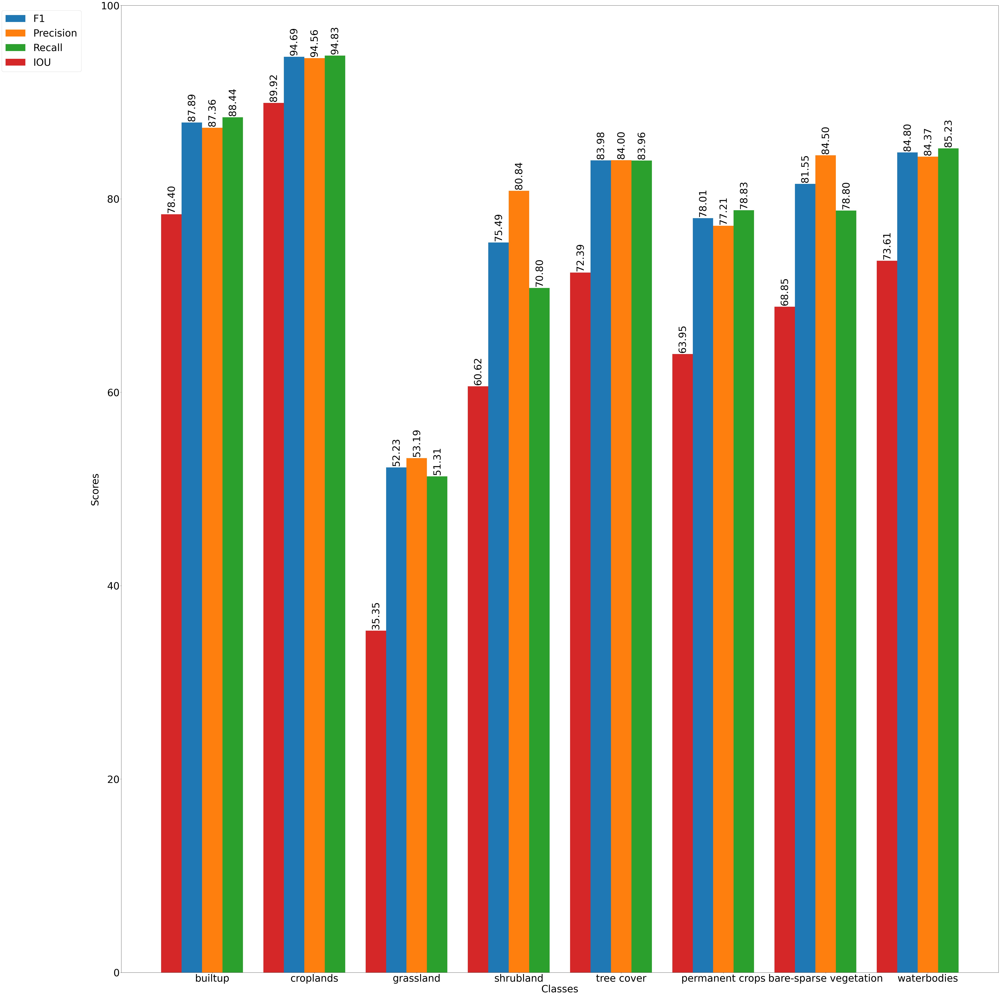

In [34]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

labels = ing_Class_names

F1_ = F1 * 100
Prec_ = Prec * 100
Recall_ = Rec * 100
IOU_ = IOU * 100

params = {'font.size': 42,
              'xtick.labelsize':42,
              'ytick.labelsize':42}
matplotlib.rcParams.update(params)

x = np.arange(len(labels))  # the label locations
width = 0.20 # the width of the bars

fig, ax = plt.subplots(figsize=(60, 60))
rects1 = ax.bar(x - width, F1_, width, label='F1')
rects2 = ax.bar(x, Prec_, width, label='Precision')
rects3 = ax.bar(x + width, Recall_, width, label='Recall')
rects4 = ax.bar(x - (2 * width), IOU_, width, label='IOU')

# Add some text for labels, title and custom x-axis tick labels, etc.
#ax.set_title('F1 Score Comparison')
ax.set_ylabel('Scores')
ax.set_xlabel('Classes')
ax.set_xticks(x)
ax.set_xticklabels(labels)
plt.setp(ax.get_xticklabels(), rotation=0, ha="center",
             rotation_mode="anchor")

ax.legend(loc='best', bbox_to_anchor=(-0.04, 0.5, 0., 0.5))
#ax.set_yticks(np.arange(60,10,20))

ax.set_ylim([0,100])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        if height == 0:
            continue
        else:
            ax.annotate('{:.2f}'.format(height),
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 5),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom', rotation = 90)

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)
autolabel(rects4)
plt.savefig(r'D:\sonuc\F1_score.png', pad_inches = 0, transparent=False, bbox_inches='tight')

fig.tight_layout()

plt.show()